In [1]:
import sys
sys.path.append('../')
import numpy as np
from IPython.display import HTML

from rover_simulator.world import World
from rover_simulator.sensor import ImaginalSensor
from rover_simulator.rover import BasicRover
from rover_simulator.history import SimpleHistory
from rover_simulator.navigation.localizer import ImaginalLocalizer
from rover_simulator.navigation.controller import ConstantSpeedController
from rover_simulator.navigation.sensing_planner import SimpleSensingPlanner

In [2]:
world = World()
world.read_objects("../rover_simulator/examples/environment_complex.txt")

In [3]:
history = SimpleHistory()
rover = BasicRover(
    np.array([1.0, 1.0, 0.0]), 0.5,
    sensor=ImaginalSensor(obstacles=world.obstacles),
    sensing_planner=SimpleSensingPlanner(sense_interval_distance=8.0, sense_interval_angle=np.pi/4),
    controller=ConstantSpeedController(w=np.pi/32),
    localizer=ImaginalLocalizer(),
    history=history
)
world.append_rover(rover)

In [4]:
world.simulate(200)

  0%|          | 0/200 [00:00<?, ?it/s]

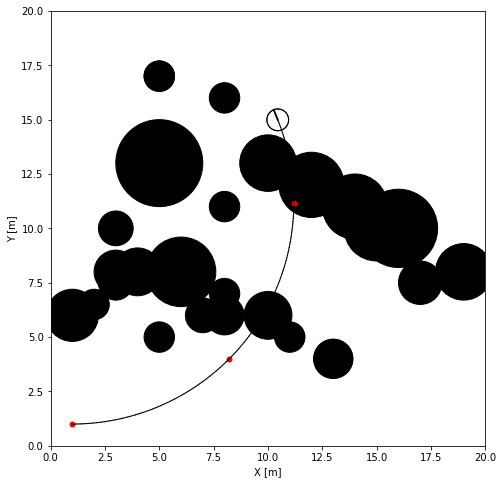

In [5]:
history.draw(
    xlim=[0, 20], ylim=[0, 20],
    obstacles=world.obstacles, enlarge_range=rover.r,
    draw_sensing_points_flag=True
)

In [6]:
history.animate(
    xlim=[0, 20], ylim=[0, 20],
    obstacles=world.obstacles,
    enlarge_range=rover.r,
    draw_sensing_points_flag=True,
    draw_sensing_results_flag=True,
    draw_sensing_area_flag=True,
    #save_path="log/sensing_planner.mp4"
)
HTML(history.ani.to_jshtml())

  0%|          | 0/200 [00:00<?, ?it/s]